<a href="https://colab.research.google.com/github/leoUninova/for-stack-excahgne/blob/master/report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#SETUP


##Images and tables

In [0]:
#@title Install packagages to read czi files 
pip install -q czifile

     |████████████████████████████████| 133kB 5.1MB/s 


In [0]:
#@title mount drive 

from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#@title import packaged 
import pandas as pd
from czifile import CziFile
import os 
import glob
from matplotlib import pylab
import matplotlib.pyplot as plt
from google.colab import widgets



In [0]:
#@title Display tables and sheet list functions / display images and load czi 
def sheet_list(name): 
  listOfdf=[]
  listOfStr=[]
  sh = gc.open(name)
  for i in range (len(sh.worksheets())):
    worksheet=sh.get_worksheet(i)
    rows = worksheet.get_all_values()
    headers = rows.pop(0)
    df = pd.DataFrame(rows, columns=headers)
    listOfdf.append(df)
    listOfStr.append(sh.get_worksheet(i).title)
  zipbObj = zip(listOfStr, listOfdf)
  dictOfWords = dict(zipbObj)
  return dictOfWords

def DisplayTables(dfdict):
  tb = widgets.TabBar(list(dfdict.keys()))
  for i, values in enumerate (dfdict.values()):
    with tb.output_to(i, select=(i < 1)):
      display(values)
      
      
#display images and load czi 
def dataczi (files):
  listOfarray=[]
  for idx, file in enumerate(files):
    with CziFile(file) as czi:
        image_arrays = czi.asarray()
    images=image_arrays[0]    
    listOfarray.append(images)
  zipbObj = zip(files, listOfarray)
  dictOfWords = dict(zipbObj)
  return dictOfWords


def DisplayImages(imdict):
  tb = widgets.TabBar(list(imdict.keys()))
  for i, values in enumerate (imdict.values()):
    with tb.output_to(i, select=(i < 1)):
      fig, ax = plt.subplots(figsize=(14, 10))
      ax.imshow(values)
      pylab.show()
        
      
  


In [0]:
#@title authroize setup google sheets
from google.colab import auth
auth.authenticate_user()

import gspread
from oauth2client.client import GoogleCredentials

gc = gspread.authorize(GoogleCredentials.get_application_default())

In [0]:
#@title CZI images: dicofdf from files - imagee from df  
def dicfordf (files):
  '''
  Takes a list of files, splits them on the first "-".
  Creates a dictioanry with the number as key and name as value. 
  When a key has been alreayd used, it appends.
  Creates a dataframe, sorts the collumns making then integers. 
  Returns the transpose of the dataframe.
  '''
  new_dict = {}
  for idx, file in enumerate(files):
    number, name = file.split('-',1)
    if number in new_dict:
        new_dict[number].append(file)
    else:
        new_dict[number] = [file] 
  df=pd.DataFrame.from_dict(new_dict, orient='index')
#   df.index = df.index.map(int)
#   df=df.sort_index()
  return (df.T)


def ImageTabFromdf(data):
  '''
  Takes a dataframe. 
  uses collumns as tab names. 
  Iterates over tab and creates tb2 subplots
  takes the filename and plots it czi . 
  '''  
  
  tb = widgets.TabBar(list(data.columns))
  for i, k in enumerate(list(data.columns)):
    with tb.output_to(i, select=(i < 1)):
      wid1=list(df[k].dropna())
      tb2 = widgets.TabBar(wid1, location='start') 
      for w in range(len(wid1)):
        with tb2.output_to(wid1[w],  select=(i < 1)):
          file=wid1[w]#str(k)+'-'+ str(wid1[w])
          with CziFile(file) as czi: #get image as array from czi format
               image_arrays = czi.asarray()
          images=image_arrays[0] 
          fig, ax = plt.subplots(figsize=(12, 8))
          ax.imshow(images)
          pylab.show()


In [0]:
#@title import sheet, get titles of different sheets, create dictionray with dataframes/ import folders Images
#http://www.indjango.com/access-google-sheets-in-python-using-gspread/
sh = gc.open("TASI BACTH")
worksheet_list = sh.worksheets()

#create dictioanry with dataframe of sheets, keys are the names of the sheets 
tabledic=sheet_list("TASI BACTH")

#import folders names for images
os.chdir('/content/drive/My Drive/Images-microsope/seecond/')
folders=next(os.walk('.'))[1] 

#Ta-si batch introduction

12 transistors were fabricated. Varying: the thickness (150, 250) and the composition (Si-TA, Si-Ta-Si, Ta-Si) of the dielectric; and the Semiconductor annealing Temperature (180, 300). 



In [0]:
#@title Intro sheet and overivew all tables { run: "auto", vertical-output: true }


Show = True #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DisplayTables(tabledic)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,Mo-G (nm),Si (nm),Ta (nm),si (nm),GIZO (nm),ANNEALING T,Mo-SD (nm),ANNEALING
0,11,60,0,214,18,60,300,75,180
1,12,60,0,214,18,60,180,75,180
2,3,60,18,214,18,60,300,75,180
3,4,60,18,214,18,60,180,75,180
4,5,60,18,214,0,60,300,75,180
5,6,60,18,214,0,60,180,75,180
6,1,60,18,114,0,60,300,75,180
7,2,60,18,114,0,60,180,75,180
8,7,60,18,114,18,60,300,75,180
9,8,60,18,114,18,60,180,75,180


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Sample,measured,good,ratio
0,250-300-SITA,14,4,"28,57%"
1,250-300-SITASI,12,6,"50,00%"
2,250-300-TASI,10,0,"0,00%"
3,250-180-SITA,9,1,"11,11%"
4,250-180-SITASI,9,2,"22,22%"
5,250-180-TASI,9,4,"44,44%"
6,150-300-SITA,8,0,"0,00%"
7,150-300-SITASI,14,2,"14,29%"
8,150-300-TASI,7,0,"0,00%"
9,150-180-SITA,4,0,"0,00%"


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,
0,1,3012,s-6,"90, 60","110, 60",bad,no,New developper,
1,4,3012,s-6,"90, 60","110, 60",good,yes,,
2,3,3012,s-6,"90, 60","110, 60",bad,yes,,
3,5,3012,s-6,"90, 60","110, 60",good,yes,New developper,
4,6,3012,s-6,"90, 60","110, 60",good,yes 10 min,was called to do another task,
5,1,3012,s-6,"90, 60","110, 60",good,yes,,
6,2,3012,s-6,"90, 60","110, 60",good,yes,,
7,9,3012,s-6,"90, 60","110, 60",good,yes,,
8,8,3012,s-6,"90, 60","110, 60",good,no,,
9,12,3012,s-6,"90, 60","110, 60",good,no,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Samples,Deposition,AR,O,Presssure,Power,DC bias,DCV,Load/Tune,Reflective,Presputtering,deposition,growth rate,Thickness,Notes
0,1-6,SI02,14,1,"2,3",200,15-76,495,88-24,0,12,20,"0,9",18,"Mistakenly put 6 on instead of 4, repalced 1,2..."
1,3:6-11-12,Ta2O5,14,1,"2,3",100,15-82,0,49-34,0,12,"136,3057325","1,57",214,The dcv is never displayed for Ta2O5 .
2,3-4-11-12,SI02,14,1,"2,3",200,15-x,,,,12,20,"0,90",18,
3,,,,,,,,,,,36,"176,3057325",,250,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,time,exposure 2,developper,lamp power
0,6,3012,s-7,"90, 60","110, 60",half,no,new devellopper,50,,AZ726 MIF DEVELLOPPER,275
1,4,3012,s-7,"90, 60","110, 60",red (different material ),no,,43,30,,275
2,3,3012,s-7,"90, 60","110, 60",good,no,long time between pre exposure and allignment,45,,,320
3,5,3012,s-7,"90, 60","110, 60",good,no,,45,,,320
4,11,3012,s-7,"90, 70","110, 60",bad,no,maybe devellopper,45,20,,320
5,12,3012,s-7,"90, 60","110, 60",bad,no,"NEW developper, red line problem?",40,30,,320
6,6,3012,s-7,"90, 60","110, 60",bad(lines),no,,45,,,320
7,11,3012,s-7,"90, 60","110, 60",bad (lines),yes,"lines are forming a pattern, maybe mask is dir...",45,30,,320
8,12,3012,"s-6,5","90, 60","110, 60",okish (some lines),no,flew off spin coating,40,,,320
9,11,3012,s-6.5,"90, 60","110, 60",bad (lines),yes,DEVELOPMENT TOO LONG?,40,,,320


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,si02,ta205,si02,total thickness,time,time 2,time 3,time4,
0,2,18,214,18,250,900,300,300,300,etch Ta was 13 min for 150nm
1,4,18,214,,232,900,300,300,300,
2,5,,214,18,232,900,300,300,300,
3,,,,,,,,,,
4,,,,,,,,,,
5,,,etch all 6,,,"1300, gave error at a certain point",1300,,,
6,,,,,,,,,,
7,12,,,,,900,too much,,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Samples,Deposition,AR,O,Presssure,Power,DC bias,DCV,Load/Tune,Reflective,Presputtering,deposition,growth rate,Thickness
0,7-8,SI02,14,1,2.3,200,15-92,496,90-24,0-1,12,20,"0,9",18
1,7-8-9-10-1-2,Ta2O5,14,1,"2,3",100,15-68,0,42-34,0,12,"72,61146497","1,57",114
2,?,SI02,14,1,2.3,200,15-83,499,90-24,0,12,20,"0,90",18
3,,,,,,,,,,,36,"112,611465","3,37",150
4,,,,,,,,,,,"136,611465",,,
5,,,,,,,,,,,"161,611465",,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,time
0,8,3012,s-7,"90, 60","110, 60",good,no,"same day as second dev 250nm, photo after firs...",57
1,9,3012,s-7,"90, 60","110, 60",good,no,,57
2,10,3012,s-7,"90, 60","110, 60",good,no,,50
3,7,3012,s-7,"90, 60","110, 60",good,no,,53
4,2,3012,s-7,"90, 60","110, 60",good,no,,55
5,1,3012,s-7,"90, 60","110, 60",good,no,this one could not be open?,58
6,,,,,,,,,
7,,,,,,,,,
8,sample,Ana coment,Notes,,,,,,
9,10,good,,,,,,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Day 3 sample,State
0,1,through
1,2,not etched
2,3,through
3,4,"grey, etched maybe not enough"
4,5,thourgh
5,6,grey maybe not enough
6,7,through
7,8,etched-maybe not enough?
8,9,through
9,10,through


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,time
0,2,3012,s-6.5,"90, 60",no,good,no,ana: postbake increases adhesion and your hole...,nan
1,6,3012,s-6.5,"90, 60","90, 60",good,no,NEW DEVELOPPER,48
2,8,3012,s-6.5,"90, 60",no,good,no,,50
3,11,3012,s-6.5,"90, 60",no,good,no,did a second devellopmnet,"50, 20"
4,12,3012,s-6.5,"90, 60",no,good,no,,60
5,4,3012,s-6.5,"90, 60",no,good,no,,50


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,time,Notes
0,11,3007,s-6,"90, 60",no,good,no,40,"using the resit on the table, worked so kept g..."
1,12,3007,s-6,"90, 60",no,goood,no,40,
2,4,3007,s-6,"90, 60",no,goood,no,40,
3,6,3007,s-6,"90, 60",no,goood,no,42,
4,8,3007,s-6,"90, 60",no,goood,no,41,
5,2,3007,s-6,"90, 60",no,goood,no,40,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Samples,Deposition,AR,O,Presssure,Power,DC bias,DCV,Load/Tune,Reflective,Presputtering,deposition,growth rate,Thickness,Notes
0,11-12-3-4-5-6,GIZO,14,2,2.3,100,0,278,55/33,0,12,12,,,
1,1-2-7-8-9-10,GIZO,14,2,2.3,100,0,,,0,7,12,,,
2,,,,,,,,,,,,,,,
3,,,,,,,,,,,,,,,
4,Heating,T,time,notes,,,,,,,,,,,
5,even,85-180,81,The hotplate started hotter and only had it fo...,,,,,,,,,,,
6,odd,20-300,101,,,,,,,,,,,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Samples,Deposition,AR,O,Presssure,Power,DC bias,DCV,Load/Tune,Reflective,Presputtering,deposition,growth rate,Thickness,Notes
0,even,Mo,50,0,"1,7",175,0,179,37/29,0,10,15,5,75,longer to fill holes
1,odd,Mo,50,0,1.7,175,0,179,37/29,0,7,15,5,75,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake(T, s)",postbake,run 1,time,Notes
0,2,3012,s-6.5,"90, 60",no,good,45,
1,12,3012,s-6.5,"90, 60",no,good,35,New developper
2,8,3012,s-6.5,"90, 60",no,good,35,
3,6,3012,s-6.5,"90, 60",no,good,,
4,10,3012,s-6.5,"90, 60",no,good,,
5,5,3012,s-6.5,"90, 60",no,good,45,probably coming out in pieces
6,11,3012,s-6.5,"90, 60",no,good,37,
7,3,3012,s-6,"90, 60",no,good,30,anna changed parameters for her thng and i jus...
8,1,3012,s-6,"90, 60",no,good,35,
9,9,3012,s-6,"90, 60",no,good,40,


<IPython.core.display.Javascript object>

#Issues in Development process

There were many developpment issues for most layers. 
Possible factors influencing development issures are

* Low quality/quantity developer 
* Climate control 
* Heating issues 





## MO-Gate Developpment

The standard parameters followed previously are: 

>prebake (T, time) | exposure (type, time) | postbake (T, time)
>--- | --- | --- 
>90, 60 | s, 6| 110, 60


I developped the first sample with Ana. When usuccesfull,  she suggested inserting a  **preheat of (110, 60)**. 
The standard here for '"good" development was lowered due to big issues getting photoresist to come out. There is a large amount of photoresist that needs to come out every time, making the developper dirty fast. The **lack of developer** meant using low quality developper. 

Some samples were developed **without  preheating** and there was **no difference**. 
Ring-like shapes apppeared, probably due to using dirty developper or not enough of it. 

In [0]:
#@title MO-G Developpment { run: "auto" }  
Show = True #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'Mo-G-development', )}
  DisplayTables(DIE3)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,
0,1,3012,s-6,"90, 60","110, 60",bad,no,New developper,
1,4,3012,s-6,"90, 60","110, 60",good,yes,,
2,3,3012,s-6,"90, 60","110, 60",bad,yes,,
3,5,3012,s-6,"90, 60","110, 60",good,yes,New developper,
4,6,3012,s-6,"90, 60","110, 60",good,yes 10 min,was called to do another task,
5,1,3012,s-6,"90, 60","110, 60",good,yes,,
6,2,3012,s-6,"90, 60","110, 60",good,yes,,
7,9,3012,s-6,"90, 60","110, 60",good,yes,,
8,8,3012,s-6,"90, 60","110, 60",good,no,,
9,12,3012,s-6,"90, 60","110, 60",good,no,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

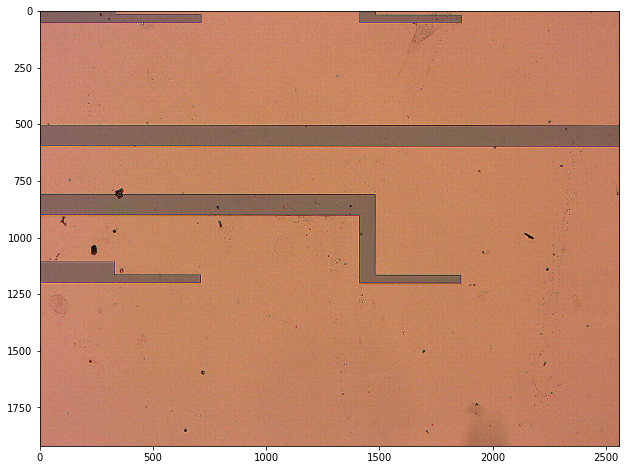

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

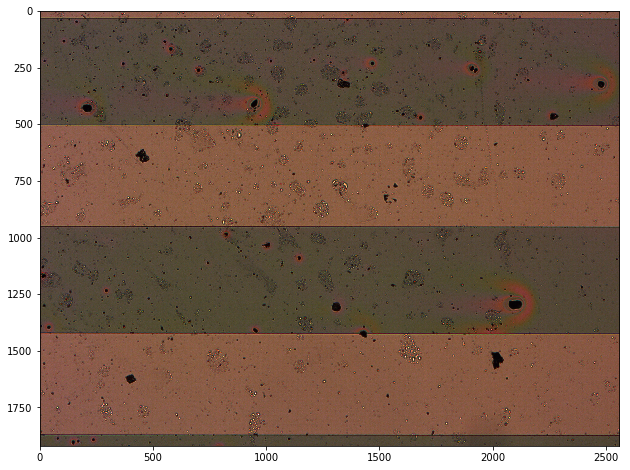

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

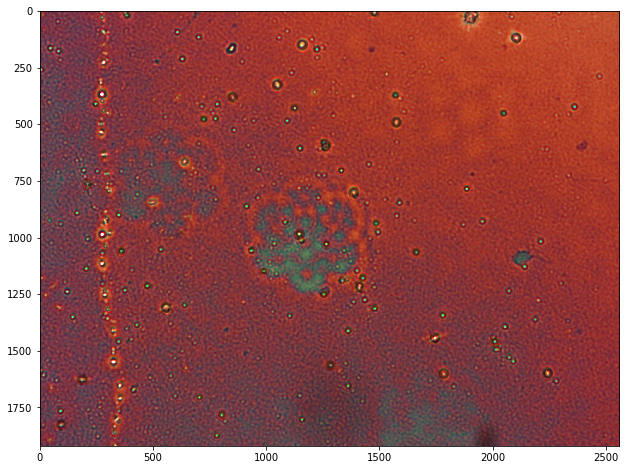

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

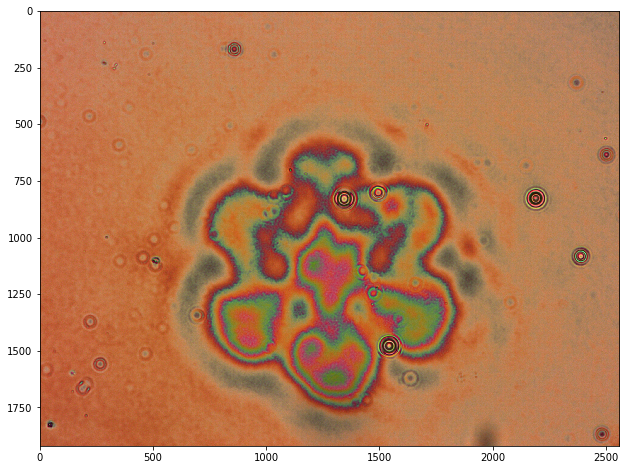

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

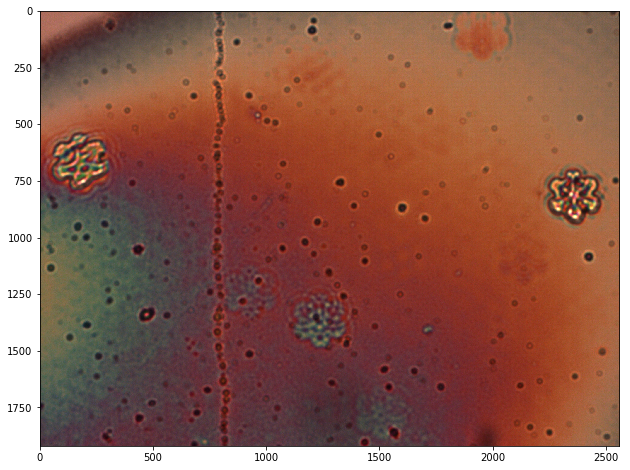

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

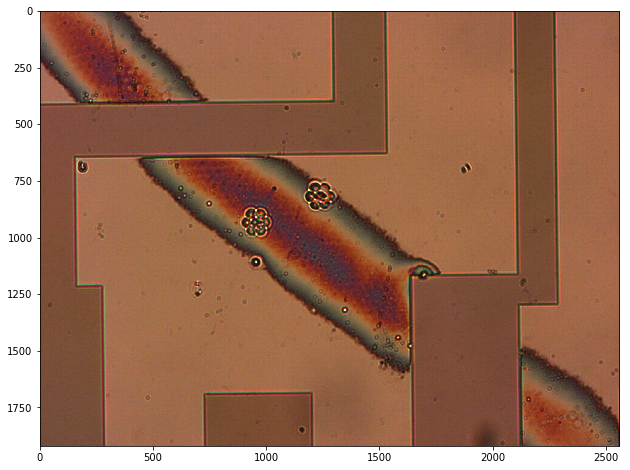

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

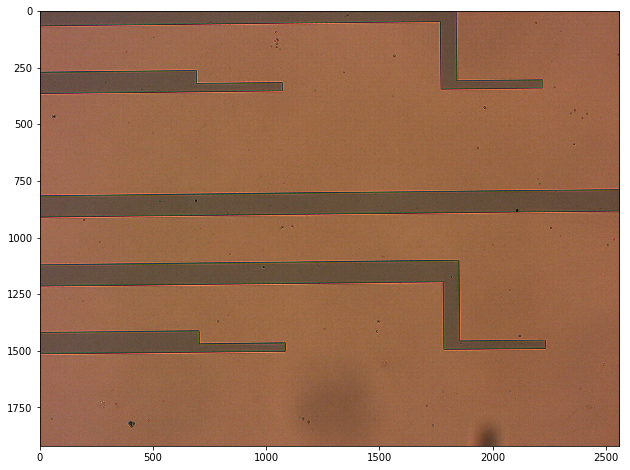

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [0]:
Show_Developemnt_Gate = True #@param {type:"boolean"}
if Show_Developemnt_Gate:
  os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'Gate')
  images_files= glob.glob('*.czi') 
  df=dicfordf(images_files)  
  ImageTabFromdf(df)

## Dielectric - development 250nm 

The standard parameters used in previous bacthes are: 

>prebake (T, time) | exposure (type, time) | postbake (T, time)
>--- | --- | --- 
>90, 60 | s, 7| 110, 60

I started off following what i had done in other batches **(no pre-heat)**. 

As for the gate, the bar for  "good" was low due to development issues in the previous weeks. The "red line problem" was identified  as photoresist coming out. This occured with development time so as low as 40 seconds. 

Since: 
*  Incrase exposure time --> increases differencce between exposed and unexposed--> shorted development time 

I decreased exposure **time to 6.5 seconds** closer to the range i had used other times. Probably would have been better to increase exposure time and decrease development time. 


Maria suggested this method: 
* Develop  until you see a glimpe of holes opening (light differences on pads) --> post heat sample 

The samples done with this method appeared to be open, but after etching were found not to be (probably i wasn't able to see exactly the moment to take them out)

In [0]:
#@title DIE developmenet 250 nm table { run: "auto" }


Show = True #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'Die-development-250nm', )}
  DisplayTables(DIE3)
 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,time,exposure 2,developper,lamp power
0,6,3012,s-7,"90, 60","110, 60",half,no,new devellopper,50,,AZ726 MIF DEVELLOPPER,275
1,4,3012,s-7,"90, 60","110, 60",red (different material ),no,,43,30,,275
2,3,3012,s-7,"90, 60","110, 60",good,no,long time between pre exposure and allignment,45,,,320
3,5,3012,s-7,"90, 60","110, 60",good,no,,45,,,320
4,11,3012,s-7,"90, 70","110, 60",bad,no,maybe devellopper,45,20,,320
5,12,3012,s-7,"90, 60","110, 60",bad,no,"NEW developper, red line problem?",40,30,,320
6,6,3012,s-7,"90, 60","110, 60",bad(lines),no,,45,,,320
7,11,3012,s-7,"90, 60","110, 60",bad (lines),yes,"lines are forming a pattern, maybe mask is dir...",45,30,,320
8,12,3012,"s-6,5","90, 60","110, 60",okish (some lines),no,flew off spin coating,40,,,320
9,11,3012,s-6.5,"90, 60","110, 60",bad (lines),yes,DEVELOPMENT TOO LONG?,40,,,320


<IPython.core.display.Javascript object>

In [0]:
Show_Developemnt_day1 = True #@param {type:"boolean"}
if Show_Developemnt_day1:
  os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'DiE dev day 1')
  images_files= glob.glob('*.czi') 
  df=dicfordf(images_files)  
  ImageTabFromdf(df)

## Dielectric - development 150nm 
The 150 nm looked developed raesonably well. 

In [0]:
#@title DIE developmenet 150 nm table { run: "auto" }

Show = True #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'Die-development-150nm', )}
  DisplayTables(DIE3)
 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,time
0,8,3012,s-7,"90, 60","110, 60",good,no,"same day as second dev 250nm, photo after firs...",57
1,9,3012,s-7,"90, 60","110, 60",good,no,,57
2,10,3012,s-7,"90, 60","110, 60",good,no,,50
3,7,3012,s-7,"90, 60","110, 60",good,no,,53
4,2,3012,s-7,"90, 60","110, 60",good,no,,55
5,1,3012,s-7,"90, 60","110, 60",good,no,this one could not be open?,58
6,,,,,,,,,
7,,,,,,,,,
8,sample,Ana coment,Notes,,,,,,
9,10,good,,,,,,,


<IPython.core.display.Javascript object>

In [0]:
Show_Developemnt_day2 = True #@param {type:"boolean"}
if Show_Developemnt_day1:
  os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'DIE dev day 2 ')
  images_files= glob.glob('*.czi') 
  df=dicfordf(images_files)  
  ImageTabFromdf(df)


##DIE development DAY 3 
I evaluated which samples had been etched properely. Some samples were etched but not completely. Others i was unsure about. I decided to redo all the samples i was unsure about. 
Since **postbake** increases adhesion, Ana suggested removing it. Also **preheat** was removed.
All the samples developed well, there were no issues throughout the development. This day was the first day in which **the room had better climate control. Perhaps the heat was affecting development.**


Since after etching the samples woudl not have uniform open holes (all white moli or all black no moli) and due to the color similarity between moli and the samples, it was hard to tell if they were open or not: i decided to etch them all the whole way through to make sure. 

In [0]:
#@title DIE developmenet day 3: Evaluation and table { run: "auto" }
Show = True #@param {type:"boolean"}

#commented out since it is already in memory 
# tabledic=sheet_list("TASI BACTH")

if Show:
  DIE3={k: tabledic[k] for k in ('Die-dev-day3-before-starting', 'Die-development-day3')}
  DisplayTables(DIE3)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Day 3 sample,State
0,1,through
1,2,not etched
2,3,through
3,4,"grey, etched maybe not enough"
4,5,thourgh
5,6,grey maybe not enough
6,7,through
7,8,etched-maybe not enough?
8,9,through
9,10,through


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,Notes,time
0,2,3012,s-6.5,"90, 60",no,good,no,ana: postbake increases adhesion and your hole...,nan
1,6,3012,s-6.5,"90, 60","90, 60",good,no,NEW DEVELOPPER,48
2,8,3012,s-6.5,"90, 60",no,good,no,,50
3,11,3012,s-6.5,"90, 60",no,good,no,did a second devellopmnet,"50, 20"
4,12,3012,s-6.5,"90, 60",no,good,no,,60
5,4,3012,s-6.5,"90, 60",no,good,no,,50


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

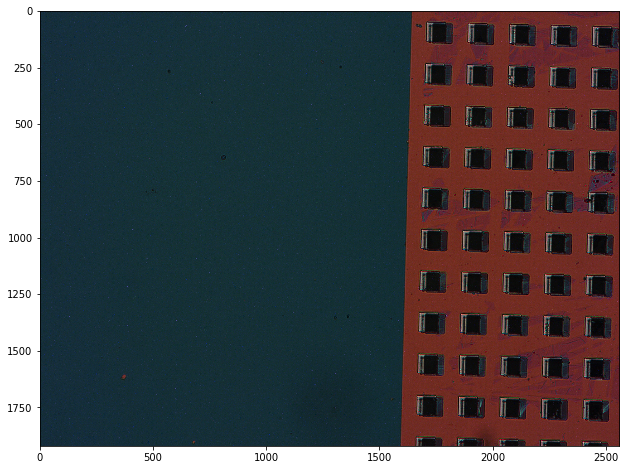

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

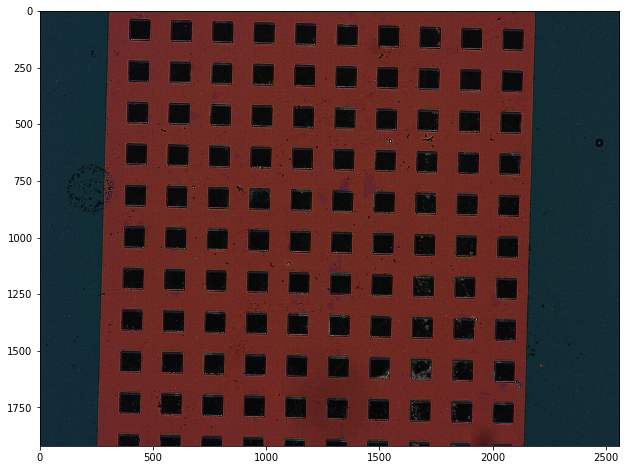

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

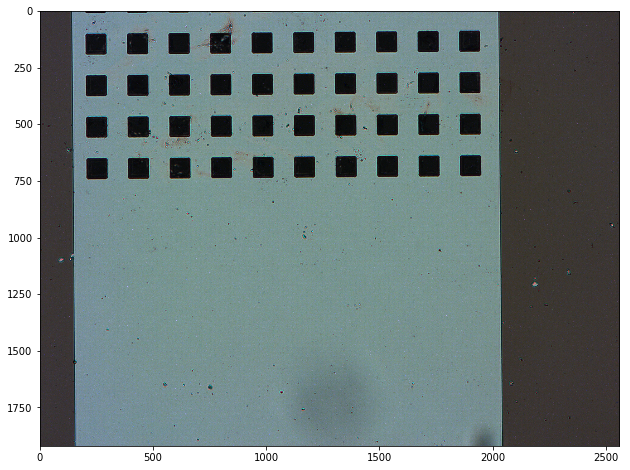

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

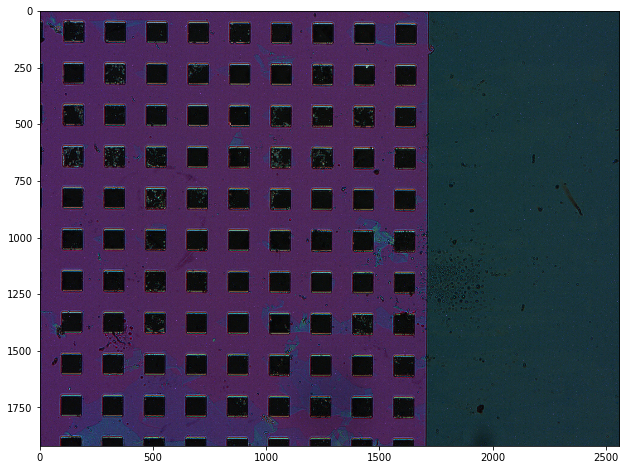

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

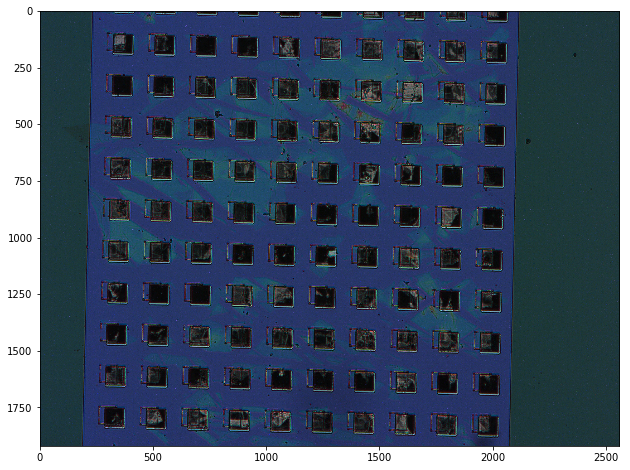

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

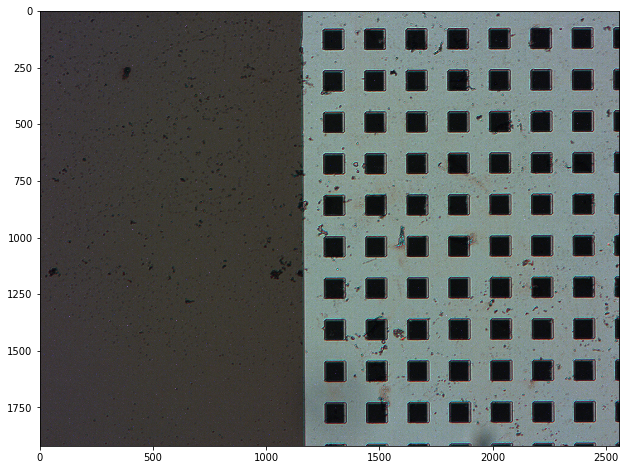

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [0]:
Show_Developemnt_day3 = True #@param {type:"boolean"}
if Show_Developemnt_day1:
  os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'DIE dev day 3')
  images_files= glob.glob('*.czi') 
  df=dicfordf(images_files)  
  ImageTabFromdf(df)

## Semiconductor development
The semiconductor was developed in **lift off**.  I used a different **photoresist** 3007 instead of 3012. There were **no problems** with the development. There were 0 issues after 6 developemnts, so i stopped taking notes. 

In [0]:
#@title Semiconductor development: table { run: "auto" }

Show = True #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'dev semi', )}
  DisplayTables(DIE3)
 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake (T, s)",postbake,run 1,preheat 110 60,time,Notes
0,11,3007,s-6,"90, 60",no,good,no,40,"using the resit on the table, worked so kept g..."
1,12,3007,s-6,"90, 60",no,goood,no,40,
2,4,3007,s-6,"90, 60",no,goood,no,40,
3,6,3007,s-6,"90, 60",no,goood,no,42,
4,8,3007,s-6,"90, 60",no,goood,no,41,
5,2,3007,s-6,"90, 60",no,goood,no,40,


<IPython.core.display.Javascript object>

## S-D Development 
Only 1 sample had to be re-developed.Varying the time of the development did not affect the results.  I used the **3012 photoresist**, indicating that it wasn't the photoresit the issue.

In [0]:
#@title SD-development : table { run: "auto" }


Show = True #@param {type:"boolean"}

if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'SD-development ', )}
  DisplayTables(DIE3)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,photoresist,exposure,"prebake(T, s)",postbake,run 1,time,Notes
0,2,3012,s-6.5,"90, 60",no,good,45,
1,12,3012,s-6.5,"90, 60",no,good,35,New developper
2,8,3012,s-6.5,"90, 60",no,good,35,
3,6,3012,s-6.5,"90, 60",no,good,,
4,10,3012,s-6.5,"90, 60",no,good,,
5,5,3012,s-6.5,"90, 60",no,good,45,probably coming out in pieces
6,11,3012,s-6.5,"90, 60",no,good,37,
7,3,3012,s-6,"90, 60",no,good,30,anna changed parameters for her thng and i jus...
8,1,3012,s-6,"90, 60",no,good,35,
9,9,3012,s-6,"90, 60",no,good,40,


<IPython.core.display.Javascript object>

##Post heating "Bubble" formation.

After the annealing step, bubbles appeared on the Gate structure. These strucures were not present before. There does not appear to  be a pattern betwee the Temperature  **(180:even, 300: odd)**  or the Dielectric structure (in pairs by 2) . 




 ### dictioanries from folders 

In [0]:
#@title Semi vs SD bubbles 
def dataczi (files):
  number=[]
  name=[]
  for idx, file in enumerate(files):
    number.append(file[:file.find('-')])
    name.append(file[file.find('-'):])
  #create dictionary
  dct = {x: {str(y): z } for x, y, z in zip(number,name,files)}
  return dct

def create_tab(location, wid1, wid2):
  tb = widgets.TabBar([wid1, wid2], location=location)
  with tb.output_to(wid1,  select=(i < 1)):
    if pd.notnull(df.iloc[0][i]):
      os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'dev semi')
      with CziFile(str(df.iloc[0][i])) as czi: #get image as array from czi format
        image_arrays = czi.asarray()
      images=image_arrays[0] 
      fig, ax = plt.subplots(figsize=(12, 8))
      ax.imshow(images)
      pylab.show()

  with tb.output_to(wid2,  select=(i < 1)):
    if pd.notnull(df.iloc[1][i]):
      os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'Source-Drain')
      with CziFile(str(df.iloc[1][i])) as czi: #get image as array from czi format
        image_arrays = czi.asarray()
      images=image_arrays[0] 
      fig, ax = plt.subplots(figsize=(12, 8))
      ax.imshow(images)
      pylab.show()

#main()
os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'dev semi')
images_files= glob.glob('*.czi')      
dicimagename= dataczi(images_files)
df=pd.DataFrame(dataczi(images_files))
os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + 'Source-Drain')
images_files= glob.glob('*.czi')
dicimagename2= dataczi(images_files)

df=pd.concat([df,pd.DataFrame(dataczi(images_files))], sort=False )
      
tb = widgets.TabBar(list(df.columns))
for i, k in enumerate(list(df.columns)):
  with tb.output_to(i, select=(i < 1)):
    create_tab('start', str(df.iloc[0][i]), str(df.iloc[1][i]))



#Data analisis 



In [0]:
#@title Subsetting funciton
class Subsetting:   
    'do i want to pass a file every time i call subsetting or get the method and then use it as i please'

    
    def __init__(self):
        pass 
                    
                    
    def SubsetVariable ( self, data, *arg, **kwargs):  # https://stackoverflow.com/questions/22005911/convert-columns-to-string-in-pandas
        #print (data.loc[data.absIG==0])
        ''' 
        can pass **name_dict and it works.
        CHECK YOUR DATA DOESN'T HAVE .0 IF IT DOES YOU HAVE TO CALL IT WITH THAT !! 
        
        takes n argumments, joins them in a query, TRANFROMS DATASET TO STR , and gives back susett '''
        
        self.data=data
        
        qry = ' & '.join(["{} == '{}'".format(key,value) for key,value in kwargs.items()])        
        df=self.data.astype(str)
        subset=df.query(qry)
        self.subset=subset
   
    def SubsetUnique(self, data):
        data = data.drop_duplicates(subset='Names', keep='first')



In [0]:
#@title Plot functions (sat, lin, stab)

def stab_plot(data, leakage=False, title=False, show=True):
  'subset of the data '

  sub=Subsetting()
  temp=sub.SubsetVariable(data, Curve='Transfer stab')
  data=sub.subset.apply(pd.to_numeric, errors='ignore')
  #print (data.absIG.loc[data.absIG==0])
  'The plot'
  #data.reset_index()
  if data.empty:
    print ('passed empty dataframe for stab')
    return ('end') 
  
  fig, ax = plt.subplots(figsize=(10, 6))
  if title: 
    fig.suptitle('stab ' + title, fontsize=16)
  
  else: 
    fig.suptitle(f'stab {data.Temperature.iloc[0]}', fontsize=16)
  ax.set_ylabel('abs(logID)')
  ax.set_xlabel('VG')



  for key, grp in data.groupby(['Name']): 
    y=np.log10(grp.absID)
    x=grp.VG
    y2=np.log10(grp.absIG)
    
    color = next(ax._get_lines.prop_cycler)['color']
    ax.plot(x,  y,  label=key, color=color)
    
    if leakage: 
      ax.plot(x, y2, color=color , label='', linestyle='--' )
    #print(grp.loc[grp.absIG==0])


  plt.legend(loc='best')
  if show: 
    plt.show()




def lin_plot (data, leakage, title=False, show=True):
  'subset of the data '
  
  sub=Subsetting()
  temp=sub.SubsetVariable(data, Curve='Transfer lin')
  data=sub.subset.apply(pd.to_numeric, errors='ignore')
  #print (data.absIG.loc[data.absIG==0])
  'The plot'
  #data.reset_index()
  if data.empty:
    print ('passed empty dataframe for lin')
    return ('end') 
  
  fig, ax = plt.subplots(figsize=(10, 6))
  if title: 
    fig.suptitle('lin ' + title, fontsize=16)
  
  else: 
    fig.suptitle(f'lin {data.Temperature.iloc[0]}', fontsize=16)
  ax.set_ylabel('abs(logID)')
  ax.set_xlabel('VG')
  
  

  for key, grp in data.groupby(['Name']): 
    y=np.log10(grp.absID)
    x=grp.VG
    y2=np.log10(grp.absIG)
    
    color = next(ax._get_lines.prop_cycler)['color']
   
    ax.plot(x[:len(x)//2],  y[:len(x)//2],  label=key, color=color)
    
    if leakage: 
      ax.plot(x[:len(x)//2], y2[:len(x)//2], color=color , label='', linestyle='--' )
    #print(grp.loc[grp.absIG==0])
    
      
  plt.legend(loc='best')
  
  plt.show()

def sat_plot (data, leakage, title=False, show=True):
  'subset of the data '
  
  sub=Subsetting()
  temp=sub.SubsetVariable(data, Curve='Transfer sat')
  data=sub.subset.apply(pd.to_numeric, errors='ignore')
  #print (data.absIG.loc[data.absIG==0])
  'The plot'
  #data.reset_index()
  if data.empty:
    print ('passed empty dataframe for lin')
    return ('end') 
  
  fig, ax = plt.subplots(figsize=(10, 6))
  if title: 
    fig.suptitle('sat ' + title, fontsize=16)
  
  else: 
    fig.suptitle(f'sat {data.Temperature.iloc[0]}', fontsize=16)
  ax.set_ylabel('abs(logID)')
  ax.set_xlabel('VG')
  
  

  for key, grp in data.groupby(['Name']): 
    y=np.log10(grp.absID)
    x=grp.VG
    y2=np.log10(grp.absIG)
    
    color = next(ax._get_lines.prop_cycler)['color']
   
    ax.plot(x[:len(x)//2],  y[:len(x)//2],  label=key, color=color)
    
    if leakage: 
      ax.plot(x[:len(x)//2], y2[:len(x)//2], color=color , label='', linestyle='--' )
    #print(grp.loc[grp.absIG==0])
    
      
  plt.legend(loc='best')
  
  plt.show()  
  

In [0]:
#@title Plot function main ()
import pandas as pd 
import matplotlib.pyplot as plt
import itertools
import matplotlib.ticker as mtick
import numpy as np
url='https://raw.githubusercontent.com/leoUninova/Batch-TA-SI-/master/TASIone.csv'
df= pd.read_csv(url)
df.columns


#change the types of the string to acutal stings 
df.Sample= df.Sample.astype(str) 
df.Number=df.Number.astype(str)
df['Name']=   df.Sample + '-'+  df.Number




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

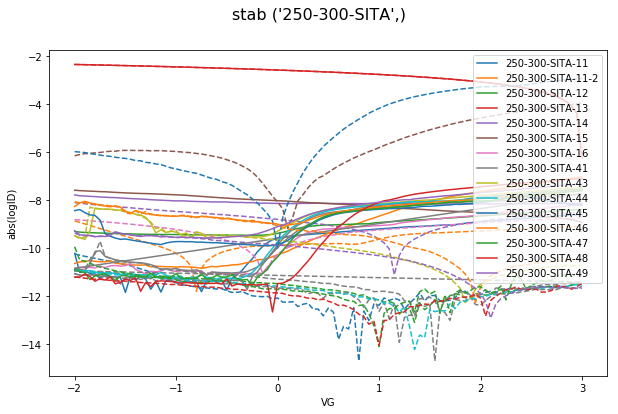

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:73: RuntimeWarning: divide by zero encountered in log10


<Figure size 216x216 with 0 Axes>

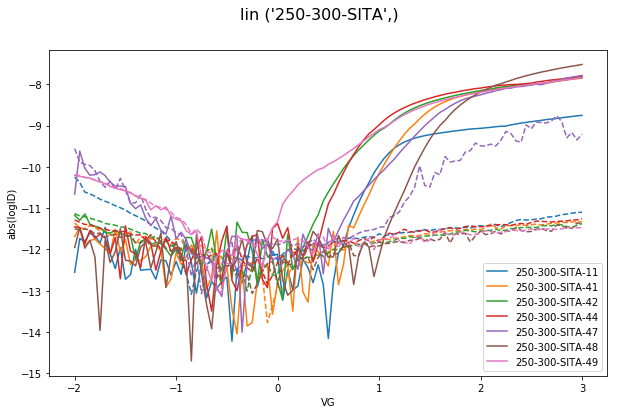

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

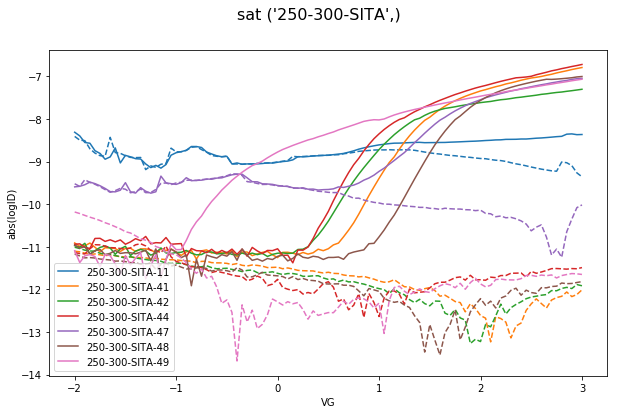

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log10


<Figure size 216x216 with 0 Axes>

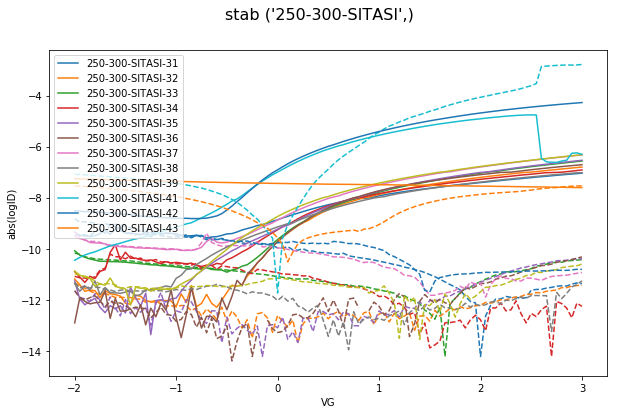

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

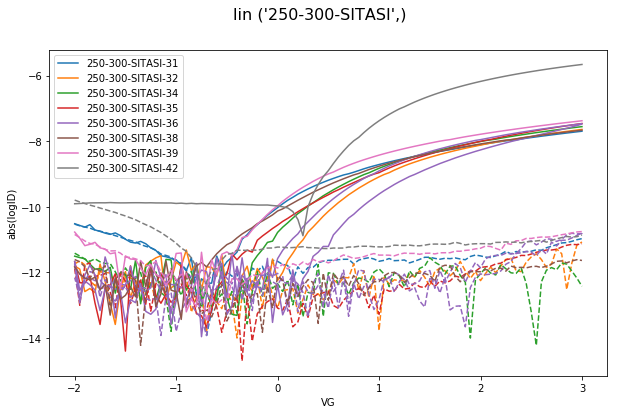

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

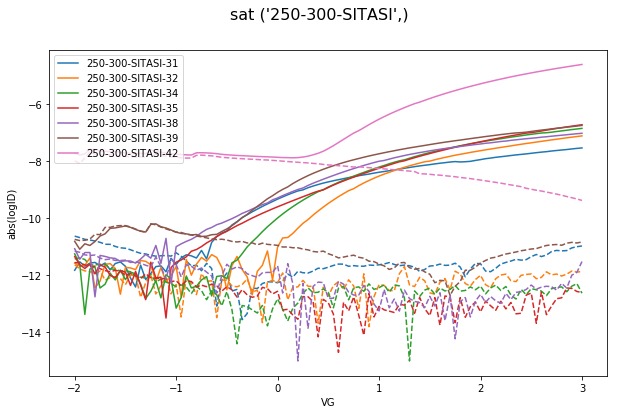

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

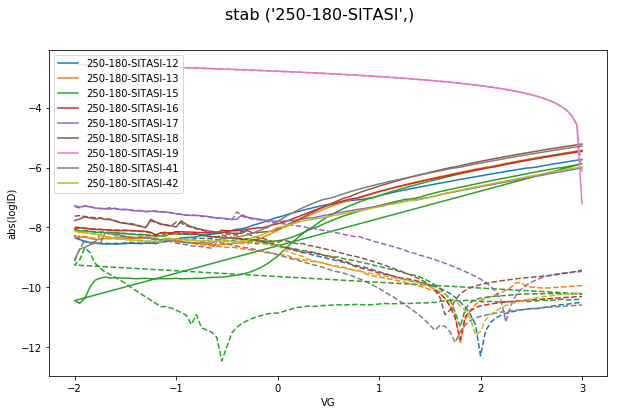

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

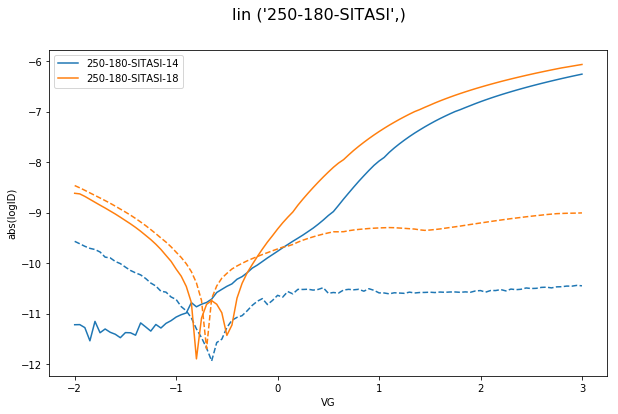

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

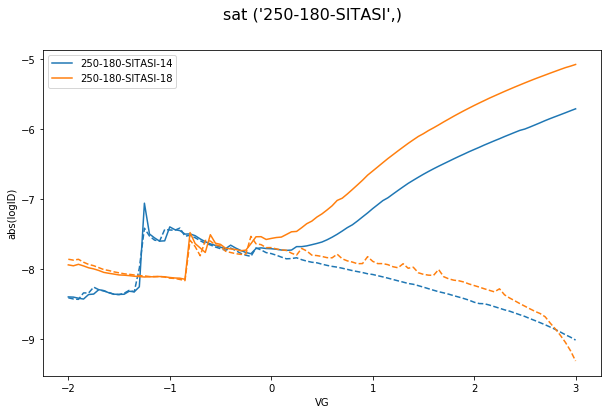

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

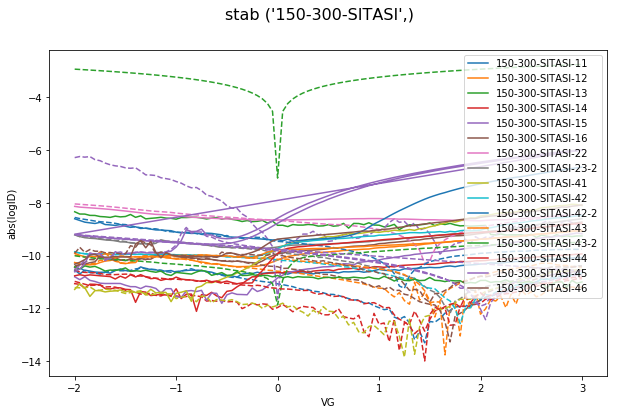

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

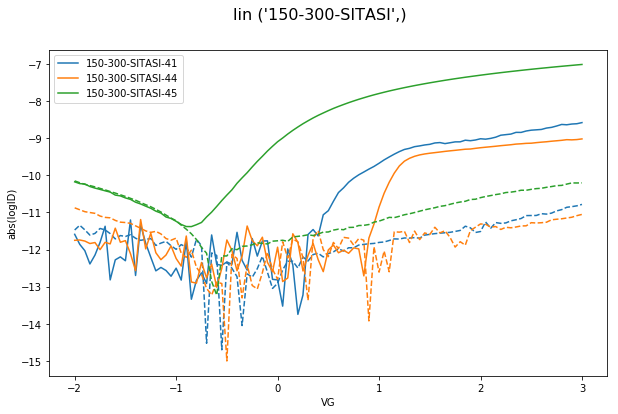

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

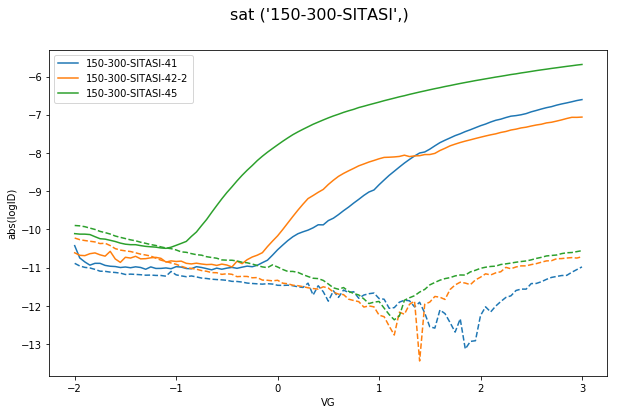

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

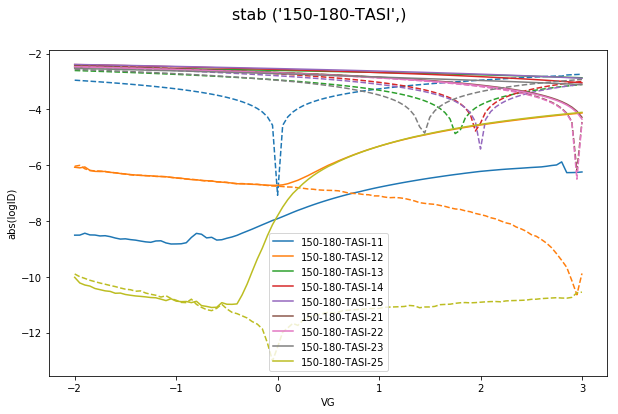

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

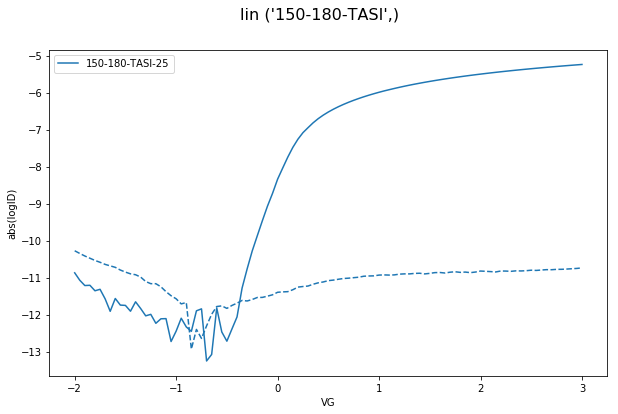

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

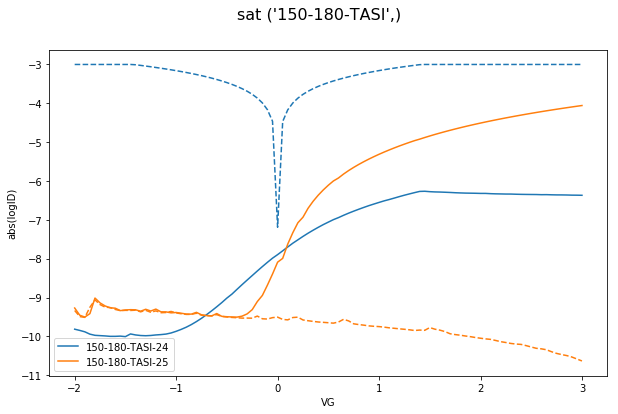

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

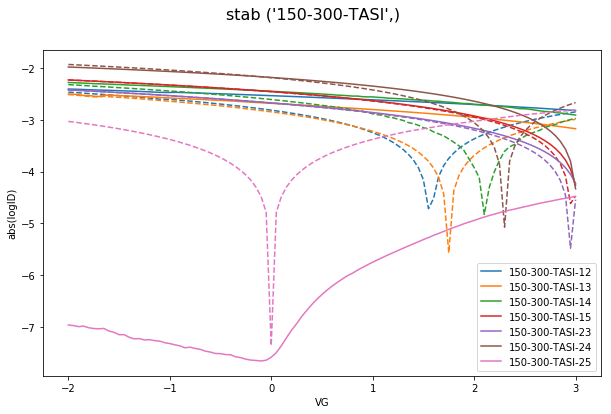

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

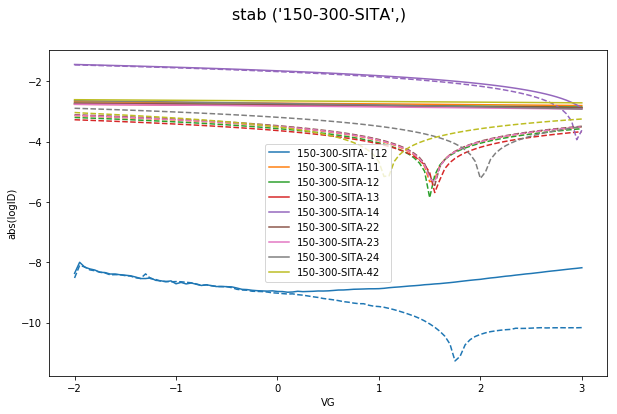

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

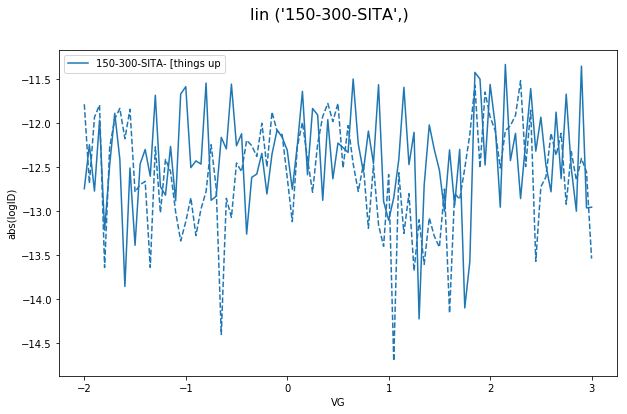

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

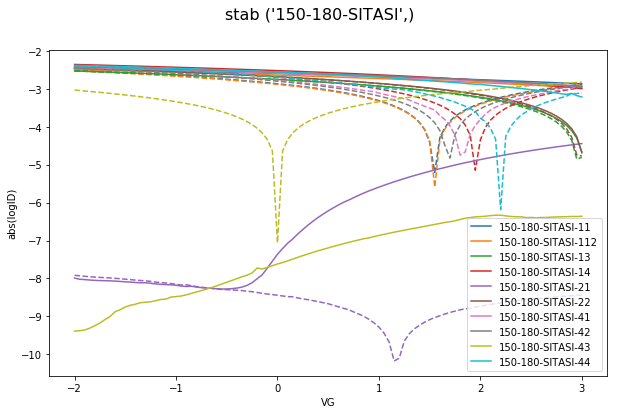

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

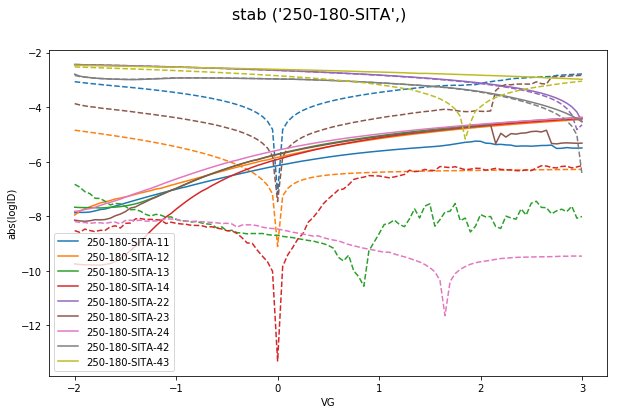

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

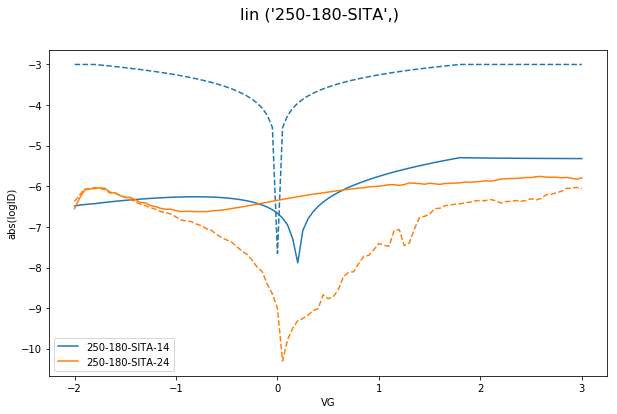

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

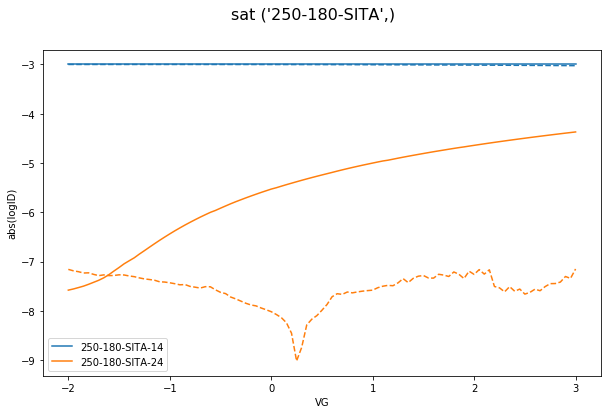

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

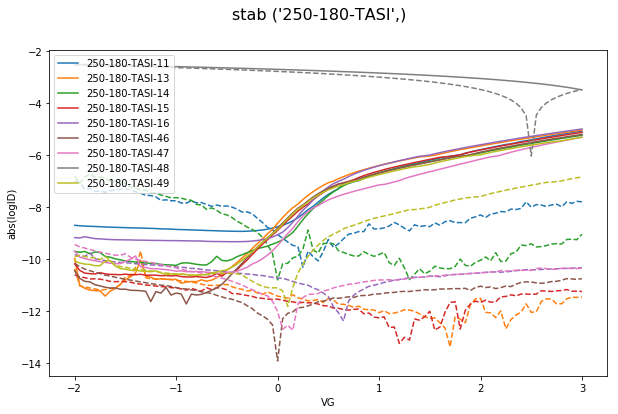

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

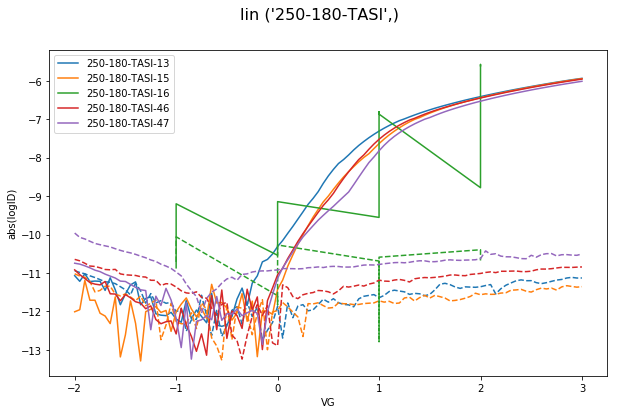

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

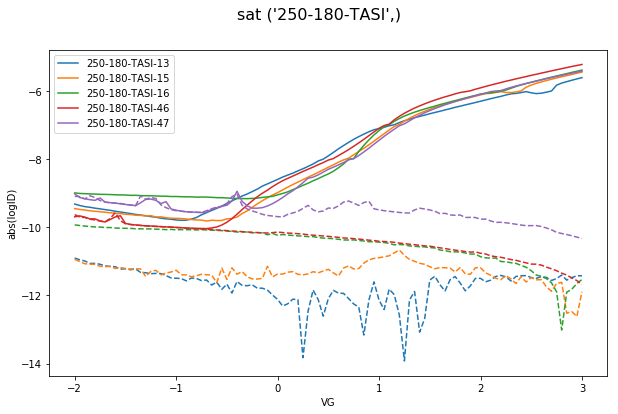

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

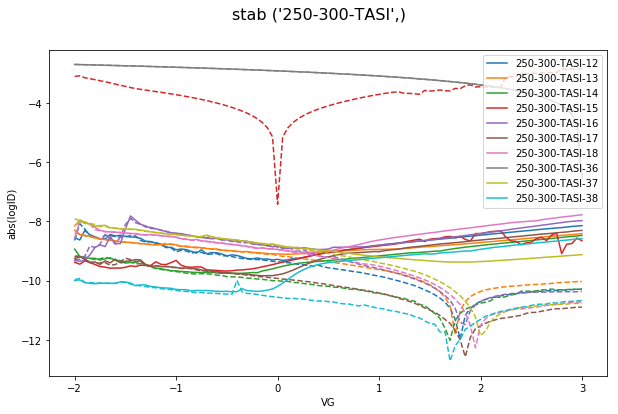

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [0]:
#@title Double widget graphs, Raw fields: { run: "auto", vertical-output: true }


Graph_division = "Sample" #@param {type:"string"}
user= list(Graph_division.split())

leakage = True #@param {type:"boolean"}



from __future__ import print_function
from google.colab import widgets
from google.colab import output
from matplotlib import pylab
from six.moves import zip


'dictionary contaning the keys we want to subset by '
params = {}  #https://stackoverflow.com/questions/1024847/add-new-keys-to-a-dictionary
sub=Subsetting()

"adding the unique values of the collumns to the dictionary "
for col in user: 
  params[col]=df[col].unique()
  

  

keys=list(params)

c= ((list(itertools.product(*map(params.get, keys))))) #https://stackoverflow.com/questions/32074543/how-to-get-the-length-of-an-itertools-product

title=[]
for i in range (len(c)):
  title.append(str(c[i]))
  
title
#the beginning of hte funciton  
    
def create_tab(location):
  tb = widgets.TabBar(['stab','lin', 'sat'], location=location)
  with tb.output_to('stab',  select=(i < 1)):
    pylab.figure(figsize=(3, 3))
    stab_plot(df1, leakage=leakage, title=str(values))
  with tb.output_to('lin',  select=(i < 1)):
    pylab.figure(figsize=(3, 3))
    lin_plot(df1, leakage=leakage, title=str(values))
  # Note you can access tab by its name (if they are unique), or
  # by its index.
  with tb.output_to(2, select=(i < 1)):
    pylab.figure(figsize=(3, 3))
    sat_plot(df1, leakage=leakage, title=str(values))  
  


# #tb = widgets.TabBar([str(i) for i in range(len(list(itertools.product(*map(params.get, keys)))))])    
tb = widgets.TabBar(title)
for i, values in enumerate (itertools.product(*map(params.get, keys))):
  df1=sub.SubsetVariable(df, **dict(zip(keys, values)))
  df1=sub.subset
  df1=df1.apply(pd.to_numeric, downcast='signed', errors='ignore')
  df1.reset_index()
  
  with tb.output_to(i, select=(i < 1)):
    create_tab('start')

In [0]:
#@title SD-development : table { run: "auto" }


Show = True #@param {type:"boolean"}

if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'Results', )}
  DisplayTables(DIE3)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,Sample,measured,good,ratio
0,250-300-SITA,14,4,"28,57%"
1,250-300-SITASI,12,6,"50,00%"
2,250-300-TASI,10,0,"0,00%"
3,250-180-SITA,9,1,"11,11%"
4,250-180-SITASI,9,2,"22,22%"
5,250-180-TASI,9,4,"44,44%"
6,150-300-SITA,8,0,"0,00%"
7,150-300-SITASI,14,2,"14,29%"
8,150-300-TASI,7,0,"0,00%"
9,150-180-SITA,4,0,"0,00%"


<IPython.core.display.Javascript object>

In [0]:
#@title table resutls 
import pandas as pd 
import matplotlib.pyplot as plt
import itertools
import matplotlib.ticker as mtick
import numpy as np
from scipy.stats import linregress
import pandas as pd 
def Vth(a, b):
  res=linregress(a, b)
  slope, intercept =res[0], res[1]
  return (-intercept/slope)
def CapacitanceUA (sit, tat): #in micrometers
  si=3.9
  ta=25
  die=(si*sit+ta*tat)/(sit+tat)
  e_0=8.854e-14 #1/cm
  Area=320e-4*20e-4 #cm2
  C=die*e_0/(sit*1e-7+ tat*1e-7) #cm  
  return C #cm2
  
def mobsat(VG, ID, C):
  res=linregress(VG[-20:], np.sqrt(ID)[-20:])
  msat=res[0]
  us=(msat**2)*(2*20/320)/C
  return us
  
#load data  
url='https://raw.githubusercontent.com/leoUninova/Batch-TA-SI-/master/TASIone.csv'
df= pd.read_csv(url)
df.columns
df.Sample= df.Sample.astype(str) 
df.Number=df.Number.astype(str)
df['Name']=   df.Sample + '-'+  df.Number

#start

    
stab=df.loc[df['Curve'] == 'Transfer stab']
df1=pd.DataFrame(columns=['sample','onoff', 'Vth', "C(F/cm2)", "mob cm2"])
for key, grp in stab.groupby(['Name']): 
  x=grp.VG[:len(grp.VG)//2]
  y=(grp.absID[:len(grp.VG)//2])
  if (max(np.log10(y))<-2) and (max(y)/min(y)>1e1):
    thick,temp, comp = grp.Name.iloc[0].split("-")[0],grp.Name.iloc[0].split("-")[1], grp.Name.iloc[0].split("-")[2]
    C=CapacitanceUA ((len(comp)/2+-1)*18, int(thick)-36)
    df1 = df1.append({'sample':grp.Name.iloc[0], 'onoff':str(max(y)/min(y)), 
                      'Vth': Vth(x[-25:],y[-25:]), "C(F/cm2)":C, 'mob cm2':mobsat(x,y,C),
                    'd': thick, 'T':temp, 'Comp':comp }, ignore_index=True)

In [0]:
#@title onoff Vth
df1.dtypes
df1.onoff=df1.onoff.astype(float)
df1.dtypes
df2=pd.DataFrame(columns=['dTComp','onff', 'Vth'])
# boxplot = df1.boxplot(column=['onoff'], by=['d','T', 'Comp' ], figsize=(14,10))
for key, grp in df1.groupby(['d','T','Comp']): 
  dtcomp=str(grp['d'].iloc[0]+ grp['T'].iloc[0]+ grp['Comp'].iloc[0])
  dtcomp=str(dtcomp)
                         
  df2=df2.append({'dTComp': dtcomp,'onff':max(grp.onoff), 'Vth':np.mean(grp.Vth) }, ignore_index=True)
            
df2

,dTComp,onff,Vth
0,150180SITASI,143.684317,-0.565131
1,150180TASI,89871.875000,-0.481147
2,150300SITASI,42478.391753,-0.281749
3,150300TASI,15.526445,-0.591392
4,250180SITA,19665.949593,-0.691948
5,250180SITASI,388.101664,-0.018054
6,250180TASI,22414.877790,-0.432478
7,250300SITA,9695.800525,0.040983
8,250300SITASI,98479.696970,-0.476826
9,250300TASI,33.774353,1.616857
